# Modelo jerárquico Normal con medias y varianzas específicas

In [1]:
# Librerías base
import time
import numpy as np
import pandas as pd
# Para datos espaciales
import geopandas as gpd
# Para las funciones de densidad
#  y muestrear de distrubciones de probabilidad
import scipy.stats as st
import scipy.special as fun
# Gráficos
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
# Cálculo del tamaño efectivo de muestra
from arviz import ess

## 1 Introducción

El tipo más simple de **datos multinivel** tiene **dos niveles**, **grupos** y **unidades dentro de los grupos**. 

Se denota con $y_{i,j}$ la observación de la unidad $i$ en el grupo $j$, para $i = 1,\ldots,n_j$ y $j=1,\ldots,m$, donde $m$ es el número de grupos y $n = \sum_{j=1}^m n_j$ es el tamaño de la muestra.

El **conjunto de datos** es $\boldsymbol{y} = (\boldsymbol{y}_1,\ldots,\boldsymbol{y}_m)$, donde $\boldsymbol{y}_j=(y_{1,j},\ldots,y_{n_j,j})$ son las observaciones asociadas con el grupo $j$, para $j=1,\ldots,m$.


## 2 Modelo

Un modelo popular para describir la **heterogeneidad de las medias** en varias poblaciones es el **modelo jerárquico Normal**, en el cual la **variabilidad dentro y entre** se modela usando **distribuciones Normales**:

- Caracterización **dentro** de los grupos:
$$
y_{i, j}\mid\theta_j,\sigma^2 \stackrel{\text {iid}}{\sim} \textsf{N}\left(\theta_j,\sigma_j^2\right)
$$
- Caracterización **entre** los grupos:
$$
\theta_{j}\mid\mu,\tau^2 \stackrel{\text {iid}}{\sim} \textsf{N}\left(\mu,\tau^2\right)
$$
$$
\sigma_j^2\mid\nu,\sigma^2 \stackrel{\text {iid}}{\sim}\textsf{GI}\left(\tfrac{\nu}{2},\tfrac{\nu\,\sigma^2}{2}\right)
$$

- Distribución **previa**:
$$
p(\mu,\tau^2,\nu,\sigma^2) = p(\mu)\,p(\tau^2)\,p(\nu)\,p(\sigma^2)
$$
donde
$$
\mu\sim\textsf{N}(\mu_0,\gamma_0^2)\qquad\tau^2\sim\textsf{GI}\left(\tfrac{\eta_0}{2},\tfrac{\eta_0\,\tau^2_0}{2}\right)
\qquad p(\nu)\propto e^{-\lambda_0\,\nu}\qquad \sigma^2\sim\textsf{Gamma}(\alpha_0,\beta_0)
$$
- Los **parámetros** del modelo son $\boldsymbol{\theta}=(\theta_1,\ldots,\theta_m,\sigma^2_1,\ldots,\sigma^2_m,\mu,\tau^2,\nu,\sigma^2)$.

- Los **hiper-parámetros** del modelo son $(\mu_0,\gamma_0^2,\eta_0,\tau^2_0, \lambda_0,\alpha_0,\beta_0)$.

![](modelo_normal_jerarquico_2.png)

## 3 Estimación

Construir un **muestreador de Gibbs** para obtener muestras de la distribución posterior $p(\boldsymbol{\theta}\mid\boldsymbol{y})$.

- Distribución **posterior**:
$$
\begin{aligned}
p(\boldsymbol{\theta} \mid \boldsymbol{y}) &\propto p(\boldsymbol{y} \mid \boldsymbol{\theta})\, p(\boldsymbol{\theta}) \\
&= p(\boldsymbol{y}_1,\ldots,\boldsymbol{y}_m \mid \theta_1,\ldots\theta_m,\sigma_1^2,\ldots,\sigma^2_m)\times p(\theta_1,\ldots,\theta_m\mid\mu,\tau^2) \\
&\quad\quad\times p(\sigma^2_1,\ldots,\sigma^2_m\mid\nu,\sigma^2) \times p(\mu,\tau^2,\nu,\sigma^2) \\
&= \prod_{j=1}^m\prod_{i=1}^{n_j} \textsf{N}\left(y_{i, j} \mid \theta_{j}, \sigma^{2}\right) \times \prod_{j=1}^m \textsf{N}\left(\theta_{j} \mid \mu, \tau^{2}\right) \\
&\quad\quad\times \prod_{j=1}^m \textsf{GI}\left(\sigma^2_{j} \mid \tfrac{\nu}{2}, \tfrac{\nu\,\sigma^{2}}{2}\right) \times \textsf{N}\left(\mu \mid \mu_{0}, \gamma_{0}^{2}\right) \\
&\quad\quad\quad\times \textsf{GI}\left(\tau^{2} \mid \tfrac{\eta_{0}}{2}, \tfrac{\eta_{0}\,\tau_{0}^{2}}{2}\right)\times e^{-\lambda_0\,\nu} \times \textsf{G}(\sigma^2\mid\alpha_0,\beta_0)
\end{aligned}
$$

Distribuciones **condicionales completas**:
$$
\begin{aligned}
\theta_{j} \mid \text { resto } &\sim\textsf{N}\left(\frac{\mu / \tau^{2} + n_{j} \bar{y}_{j} / \sigma_j^{2}}{1 / \tau^{2} + n_{j} /\sigma_j^{2}}, \frac{1}{1 / \tau^{2} + n_{j} /\sigma_j^{2}}\right) \\
\sigma_{j}^{2} \,\mid\, \text { resto } &\sim\textsf{GI}\left(\frac{\nu+n_{j}}{2}, \frac{\nu \sigma^{2}+\sum_{i=1}^{n_j}\left(y_{i, j}-\theta_{j}\right)^{2}}{2}\right) \\
\mu \mid \text { resto } &\sim\textsf{N}\left(\frac{\mu_{0} / \gamma_{0}^{2} + m \bar{\theta} / \tau^{2}}{1 / \gamma_{0}^{2} + m / \tau^{2}}, \frac{1}{1 / \gamma_{0}^{2} + m / \tau^{2}}\right) \\
\tau^{2} \mid \text { resto } &\sim\textsf{ GI }\left(\frac{\eta_{0}+m}{2}, \frac{\eta_{0} \tau_{0}^{2}+\sum_{j=1}^m\left(\theta_{j}-\mu\right)^{2}}{2}\right)\\
\sigma^{2} \mid \text { resto }&\sim\textsf{G}\left(\alpha_0+\frac{m \nu}{2},  \beta_0+\frac{\nu}{2} \sum_{j=1}^m \frac{1}{\sigma_{j}^2}\right) 
\end{aligned}
$$
La distribución condicional completa de $\nu$ **no tiene una forma cerrada** conocida:
$$
p\left(\nu \mid \text { resto }\right) \propto\left[\frac{\left(\nu\,\sigma^{2} / 2\right)^{\nu / 2}}{\Gamma\left(\nu / 2\right)}\right]^{m}\left[\prod_{j=1}^m \frac{1}{\sigma_j^{2}}\right]^{\nu / 2} {\exp}\left\{-\nu\left(\lambda_0 + \frac{\sigma^{2}}{2} \sum_{j=1}^m \frac{1}{\sigma_{j}^{2}}\right)\right\}
$$
o en escala log,
$$
\log p\left(\nu \mid \text { resto }\right) \propto \frac{m\,\nu}{2} \log(\nu\,\sigma^{2} / 2) - m\log\Gamma(\nu/2) -\frac{\nu}{2} \sum_{j=1}^m \log(\sigma_j^{2}) - \nu\left(\lambda_0 + \frac{\sigma^{2}}{2} \sum_{j=1}^m \frac{1}{\sigma_{j}^{2}}\right)\,.
$$

Para muestrear valores de $p(\nu \mid \text{resto})$ se calcula esta distribución en escala log para un rango de valores de $\nu$, se normaliza la distribución discreta resultante, y luego se simula de rango de valores de acuerdo con las probabilidades obtenidas.


## 4 Ejemplo: Puntajes de Matemáticas

Los conjuntos de datos de los archivos `SB11_1.txt` contiene una muestra aleatoria del **código del departamento de ubicación del colegio** y el **puntaje de matemáticas de los estudiantes que presentaron la Prueba Saber 11 del primer semestre de 2020**. Estos datos son de carácter público y están disponibles en https://www.icfes.gov.co. 
Se recomienda consultar la *Guía de orientación Saber 11* (Icfes, 2020) para obtener más detalles sobre la prueba. 

La prueba de matemáticas se obtiene mediante un **modelo 3PL** (modelo logístico de 3 parámetros que define la probabilidad de responder correctamente de un individuo, en función de su habilidad, la dificultad del ítem, la discriminación del ítem y el pseudo-azar) y tiene una **escala de 0 a 100** (sin decimales), con **puntaje promedio de 50 puntos** y **desviación estándar 10 puntos** (Icfes, 2018, *Guía de diseño, producción, aplicación y calificación del examen Saber 11*, p. 33).

El objetivo es **construir un modelo predictivo para el puntaje de matemáticas a nivel nacional**, tomando como datos de entrenamiento (*training data*) los resultados del primer semestre de 2020, con el fin de **hacer inferencias sobre la población de estudiantes tanto a nivel nacional como departamental**. Por lo tanto, se toma como variable de agrupamiento el departamento de ubicación del colegio del estudiante. El *Diccionario de variables Saber 11* contiene la información detallada sobre las variables de las bases de datos.


### 4.1 Estructura de los datos


- $y_{i,j}$:       puntaje de matemáticas del estudiante $i$ y en departamento $j$.
- $n_j\,\,$:       número de estudiantes en el departamento $j$.
- $\bar{y}_j\,\,$: promedio muestral del departamento $j$.
- $s^2_j\,\,$:     varianza muestral del departamento $j$.


In [2]:
SB11_1 = pd.read_csv("SB11_1_muestra.txt",sep = ' ',encoding = "UTF-8")
SB11_1.shape

(1544, 2)

In [3]:
# codigo departamentos
# https://www.fopep.gov.co/wp-content/uploads/2019/02/Tabla-C%C3%B3digos-Dane.pdf
codigo = [5, 8, 11, 13, 15, 17, 18, 19, 20, 23, 25, 27, 41, 44, 47, 50, 52, 54, 63, 66, 68, 70, 73, 76, 81, 85, 86, 88, 91, 94, 95, 97, 99]
nombre = ["ANTIOQUIA", "ATLANTICO", "BOGOTA", "BOLIVAR", "BOYACA", "CALDAS", "CAQUETA", "CAUCA", "CESAR", "CORDOBA", "CUNDINAMARCA", "CHOCO", "HUILA", "LA GUAJIRA", "MAGDALENA", "META", "NARINO", "N. SANTANDER", "QUINDIO", "RISARALDA", "SANTANDER", "SUCRE", "TOLIMA", "VALLE DEL CAUCA", "ARAUCA", "CASANARE", "PUTUMAYO", "SAN ANDRES", "AMAZONAS", "GUAINIA", "GUAVIARE", "VAUPES", "VICHADA"]
datos = pd.DataFrame({'codigo' : codigo, 'nombre' : nombre})
# base de datos con nombres
SB11_1 = SB11_1.merge(datos,on = 'codigo', how = 'left')
# numero de estuduantes por departamento
SB11_1['nombre'].value_counts(sort = False)

ANTIOQUIA           71
ATLANTICO           37
BOGOTA             395
BOLIVAR             18
BOYACA               9
CALDAS              13
CAQUETA              5
CAUCA               70
CESAR               18
CORDOBA              5
CUNDINAMARCA        94
HUILA                9
LA GUAJIRA           6
MAGDALENA            7
META                16
NARINO              55
N. SANTANDER        12
QUINDIO              4
RISARALDA           22
SANTANDER           18
TOLIMA               6
VALLE DEL CAUCA    643
ARAUCA               1
CASANARE             2
PUTUMAYO             8
Name: nombre, dtype: int64

In [4]:
# remover departamentos con un solo estudiante
SB11_1 = SB11_1[SB11_1.nombre != "ARAUCA"]
SB11_1['nombre'].value_counts(sort = False)

ANTIOQUIA           71
ATLANTICO           37
BOGOTA             395
BOLIVAR             18
BOYACA               9
CALDAS              13
CAQUETA              5
CAUCA               70
CESAR               18
CORDOBA              5
CUNDINAMARCA        94
HUILA                9
LA GUAJIRA           6
MAGDALENA            7
META                16
NARINO              55
N. SANTANDER        12
QUINDIO              4
RISARALDA           22
SANTANDER           18
TOLIMA               6
VALLE DEL CAUCA    643
CASANARE             2
PUTUMAYO             8
Name: nombre, dtype: int64

In [5]:
# m: numero de grupos (departamentos)
# n: numero de individuos (estudiantes)
m = len(SB11_1['nombre'].unique())
m

24

In [6]:
n = sum(SB11_1['nombre'].value_counts(sort = False))
n

1543

In [7]:
# y  : puntajes de los estudiantes (np.array)
# Y  : puntajes de los estudiantes (dict)
# g  : identificador secuencial de los departamentos (np.array)
# nj : numero de estudiantes en cada departamento (np.array)
# yb : promedios de los puntajes (np.array)
# s2 : varianzas de los puntajes (np.array)
# respuesta por grupos
y = SB11_1.puntaje
Y = {}
g = np.empty(n)
for j in range(m):
    idx = SB11_1.codigo == SB11_1.codigo.unique()[j]
    g[idx] = j
    Y[j] = y[idx]
estadisticos = SB11_1.groupby(['codigo','nombre']).agg(nj = ('puntaje',len), # Total
                                                       yb = ('puntaje',np.mean), # Media
                                                       s2 = ('puntaje',lambda x: np.var(x,ddof=1))) # Varianza
round(estadisticos.head(6),1)

,,nj,yb,s2
codigo,nombre,,,
5,ANTIOQUIA,71,59.1,270.4
8,ATLANTICO,37,62.1,123.2
11,BOGOTA,395,60.9,229.8
13,BOLIVAR,18,57.8,227.8
15,BOYACA,9,52.3,68.5
17,CALDAS,13,64.2,407.8


In [8]:
nj = np.array(estadisticos.nj)
yb = np.array(estadisticos.yb)
s2 = np.array(estadisticos.s2)

### 4.2 Análisis exploratorio

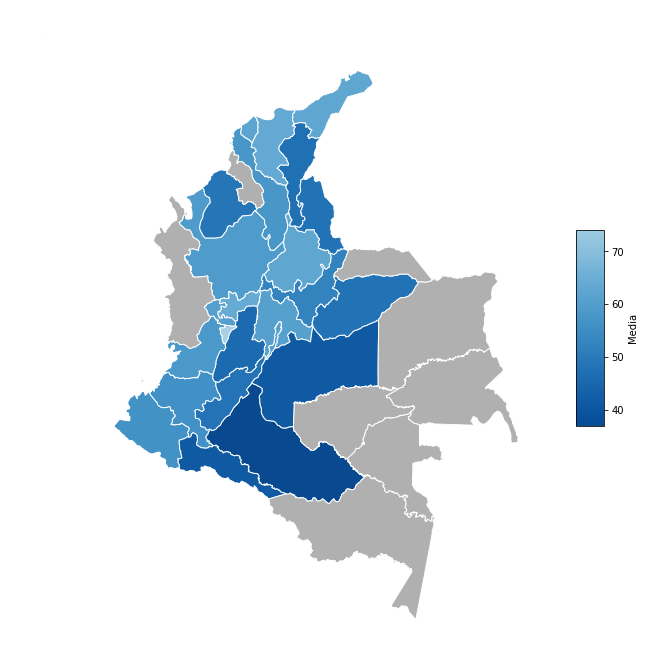

In [9]:
# Descargar shape files
# https://sites.google.com/site/seriescol/shapes
shp = gpd.read_file('depto.shp')
# promedio por departamento
dat_map = estadisticos.filter(
    items = ['yb'] # Escoger la media
).reset_index(
    level=0 # Agregar el código al dataframe
).rename(
    columns = {'codigo' : 'DPTO','yb' : 'Media'} # Renombrar columnas
)
shp.DPTO = [int(c) for c in shp.DPTO] # Convertir los códigos en enteros
plot_data = shp.merge(dat_map, how = 'left',on = 'DPTO').filter( # Hacer left-join
    items = ['DPTO','Media','geometry'] # Seleccionar columnas necesarias para el gráfico
)

# plot
fig, ax = plt.subplots(figsize = (12,12))
plot_data.plot(
    column = 'Media', # Variable que da color
    legend = True, # Poner la barra de colores de referencia
    missing_kwds = {'color' : '#b0b0b0'}, # Los departamentos sin información tendrán ese color
    ax = ax,
    # --- Los siguientes argumentos no son --- #
    # --- necesarios pero sí ayudan a -------- #
    # --- perfeccionar el gráfico ------------ #
    cmap = 'Blues_r', # Escala de colores a utilizar
    vmin = 30, vmax = 100, # Mínimo y máximo en la escala de colores
    edgecolor = 'white', # Border blancos
    legend_kwds = {'label' : 'Media', # Título de la barra de colores
                  'shrink' : 0.3, # Altura de la barra
                  'aspect' : 7, # Razón Altura/Ancho de la barra
                  'boundaries' : np.linspace(37,74,num = 100), # Puntos de la escala de colores a mostrar (la original es más extensa)    
                  'ticks' : [40,50,60,70]} # Números guía junto a la barra de colores.
)
ax.axis('off') # Quitar los ejes
plt.show()

### 4.3 Distribución previa


Teniendo en cuenta la información de la prueba, el modelo se ajusta utilizando los siguientes hiperparámetros: 
$$
\mu_0 = 50\,,\qquad
\gamma^2_0 = 25\,,\qquad
\eta_0 = 1\,,\qquad
\tau^2_0 = 100\,,\qquad
\lambda_0 = 1\,,\qquad
\alpha_0 = 1\,,\qquad
\beta_0 = 1/100\,.
$$


### 4.4 Ajuste del modelo

In [10]:
# algoritmo
def MCMC_1(B,nj,yb,s2):
    # tamaños
    n = np.sum(nj)
    m = len(nj)
    # hiperparametros
    mu0 = 50
    g20 = 25
    eta0 = 1  
    t20  = 100
    nu0  = 1  
    s20  = 100
    # valores iniciales
    theta = yb
    sig2  = np.mean(s2)
    mu    = np.mean(theta)
    tau2  = np.var(theta,ddof = 1)
    # almacenamiento
    THETA = []
    LL = []
    # cadena
    for b in range(B):
        # actualizar theta
        vtheta = 1/(1/tau2 + nj/sig2)
        theta = st.norm.rvs(vtheta*(mu/tau2 + nj*yb/sig2),
                            scale = np.sqrt(vtheta),
                            size = m)
        # actualizar sigma^2
        sig2 = st.invgamma.rvs(a = (nu0 + n)/2, 
                               scale = (nu0*s20 + np.sum((nj - 1)*s2 + nj*(yb - theta)**2))/2,
                               size = 1)
        # actualizar mu
        vmu = 1/(1/g20 + m/tau2)
        mu = st.norm.rvs(vmu*(mu0/g20 + m*np.mean(theta)/tau2),
                        scale = np.sqrt(vmu),
                        size = 1)
        # actualizar tau^2
        tau2 = st.invgamma.rvs(a = (eta0 + m)/2, 
                               scale = (eta0*t20 + m*np.var(theta) + m*(np.mean(theta) - mu)**2)/2,
                               size = 1)
        # almacenar valores
        THETA.append(list(theta)+[sig2[0],mu[0],tau2[0]])
        # log-verosimilitud
        LL.append(np.sum(
            st.norm.logpdf(x = y, loc = np.repeat(theta,nj), scale = np.sqrt(sig2))
        ))
    # fin de la cadena
    # salida
    THETA = pd.DataFrame(THETA,
                         columns = ['theta'+str(k+1) for k in range(m)]+['sig2','mu','tau2'])
    LL = pd.DataFrame(LL, columns = ['ll'])
    return {'THETA' : THETA, 'LL' : LL}

In [11]:
# algoritmo
def MCMC_2(B,nj,yb,s2):
    # tamaños
    n = np.sum(nj)
    m = len(nj)
    # hiperparametros
    mu0  = 50
    g20  = 25
    eta0 = 1
    t20  = 100
    lam0 = 1
    al0  = 1
    be0  = 1/100
    nus0 = np.linspace(1,50,num = 50) # rango en p(nu | rest)
    # valores iniciales
    theta = yb
    sig2  = s2 # sigma_j^2
    mu    = np.mean(theta)
    tau2  = np.var(theta,ddof = 1)
    nu    = 1
    ups2  = 100 # sigma^2
    # almacenamiento
    THETA = []
    LL = []
    # cadena
    for b in range(B):
        # actualizar theta
        vtheta = 1/(1/tau2 + nj/sig2)
        theta = st.norm.rvs(vtheta*(mu/tau2 + nj*yb/sig2),
                            scale = np.sqrt(vtheta),
                            size = m)
        # actualizar sigma_j^2
        sig2 = st.invgamma.rvs(a = (nu + nj)/2,
                               scale = (nu*ups2 + (nj-1)*s2 + nj*(yb - theta)**2)/2,
                               size = m)
        # actualizar mu
        vmu = 1/(1/g20 + m/tau2)
        mu = st.norm.rvs(vmu*(mu0/g20 + m*np.mean(theta)/tau2),
                        scale = np.sqrt(vmu))
        # actualizar tau^2
        tau2 = st.invgamma.rvs(a = (eta0 + m)/2, 
                               scale = (eta0*t20 + m*np.var(theta) + m*(np.mean(theta) - mu)**2)/2)   
        # actualizar nu
        lpnu = 0.5*m*nus0*np.log(0.5*nus0*ups2) - m*fun.loggamma(0.5*nus0) - 0.5*nus0*np.sum(np.log(sig2)) - nus0*(lam0 + 0.5*ups2*np.sum(1/sig2))
        nu = np.random.choice(a = nus0, p = np.exp(lpnu)/np.sum(np.exp(lpnu))) # Las probabilidades deben sumar 1
        # actualizar sigma^2
        ups2 = st.gamma.rvs(a = al0 + m*nu/2, scale = 1/(be0 + nu/2*np.sum(1/sig2)))
        # almacenar valores
        THETA.append(list(theta)+list(sig2)+[mu,tau2,nu,ups2])
        # log-verosimilitud
        LL.append(np.sum(
            st.norm.logpdf(x = y, loc = np.repeat(theta,nj), scale = np.sqrt(np.repeat(sig2,nj)) 
        )))
    # fin de la cadena
    # salida
    THETA = pd.DataFrame(THETA,
                         columns = ['theta'+str(k+1) for k in range(m)]+['sig2'+str(k+1) for k in range(m)]+['mu','tau2','nu','ups2'])
    LL = pd.DataFrame(LL, columns = ['ll'])
    return {'THETA' : THETA, 'LL' : LL}

In [12]:
# ajuste del modelo
t = time.time()
np.random.seed(1)
B = 25000
cadena1_M1 = MCMC_1(B,nj,yb,s2)
cadena2_M1 = MCMC_1(B,nj,yb,s2)
cadena3_M1 = MCMC_1(B,nj,yb,s2)
print(time.time() - t,"sec elapsed")

62.072078704833984 sec elapsed


In [13]:
# ajuste del modelo
t = time.time()
np.random.seed(12)
B = 25000
cadena1_M2 = MCMC_2(B,nj,yb,s2)
cadena2_M2 = MCMC_2(B,nj,yb,s2)
cadena3_M2 = MCMC_2(B,nj,yb,s2)
print(time.time() - t,"sec elapsed")

88.41132593154907 sec elapsed


### 4.5 Convergencia

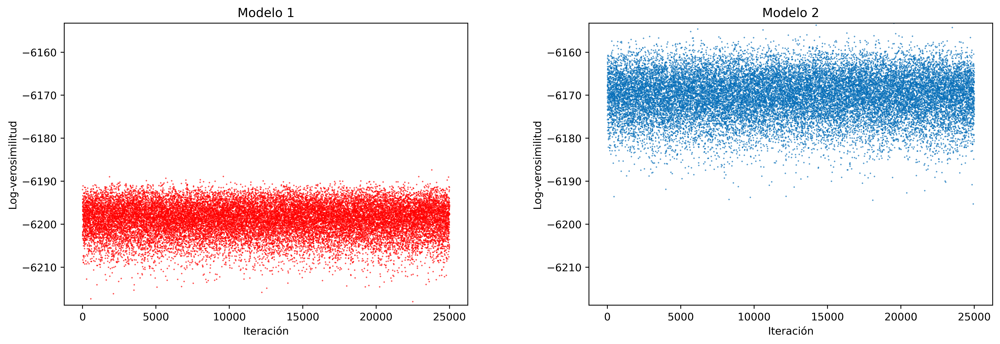

In [14]:
# cadenas
f, axes = plt.subplots(1, 2, figsize = (16,5),dpi = 500)
plt.subplots_adjust(wspace = 0.3, hspace = 0.2)
yrange = (np.min(list(cadena1_M1['LL'].ll)+list(cadena1_M2['LL'].ll)),
         np.max(list(cadena1_M1['LL'].ll)+list(cadena1_M2['LL'].ll)))
#
axes[0].scatter(range(B),cadena1_M1['LL'].ll,c = 'red',s=0.1)
axes[0].set_xlabel('Iteración')
axes[0].set_ylabel('Log-verosimilitud')
axes[0].set_title('Modelo 1')
axes[0].set_ylim(yrange)
#
axes[1].scatter(range(B),cadena1_M2['LL'].ll,c = '#066EB8',s=0.1)
axes[1].set_xlabel('Iteración')
axes[1].set_ylabel('Log-verosimilitud')
axes[1].set_title('Modelo 2')
axes[1].set_ylim(yrange)
#
plt.show()

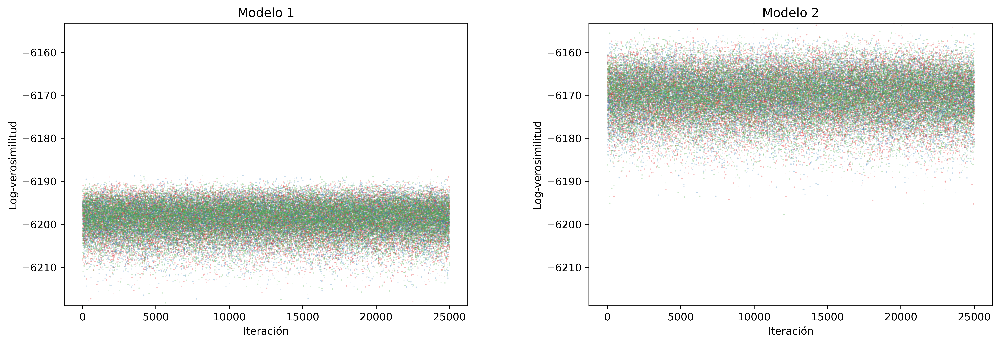

In [15]:
# cadenas
f, axes = plt.subplots(1, 2, figsize = (16,5),dpi = 500)
plt.subplots_adjust(wspace = 0.3, hspace = 0.2)
yrange = (np.min(list(cadena1_M1['LL'].ll)+list(cadena1_M2['LL'].ll)),
         np.max(list(cadena1_M1['LL'].ll)+list(cadena1_M2['LL'].ll)))
col = sns.color_palette('Set1')
col = [(*rgb,0.3) for rgb in col]
#
axes[0].scatter(range(B),cadena1_M1['LL'].ll,color = col[0],s=0.1)
axes[0].scatter(range(B),cadena2_M1['LL'].ll,color = col[1],s=0.1)
axes[0].scatter(range(B),cadena3_M1['LL'].ll,color = col[2],s=0.1)
axes[0].set_xlabel('Iteración')
axes[0].set_ylabel('Log-verosimilitud')
axes[0].set_title('Modelo 1')
axes[0].set_ylim(yrange)
#
axes[1].scatter(range(B),cadena1_M2['LL'].ll,color = col[0],s=0.1)
axes[1].scatter(range(B),cadena2_M2['LL'].ll,color = col[1],s=0.1)
axes[1].scatter(range(B),cadena3_M2['LL'].ll,color = col[2],s=0.1)
axes[1].set_xlabel('Iteración')
axes[1].set_ylabel('Log-verosimilitud')
axes[1].set_title('Modelo 2')
axes[1].set_ylim(yrange)
#
plt.show()

In [16]:
# Tamaños efecitvos de muestra
neff_M1 = [ess(np.array(cadena1_M1['THETA'])[:,k]) for k in range(m+3)]
pd.DataFrame(neff_M1,columns = ['THETA']).describe()

,THETA
count,27.000000
mean,21570.302744
std,3865.150765
min,8294.473261
25%,20832.015363
50%,22605.398586
75%,24272.007301
max,25254.359485


In [17]:
neff_M2 = [ess(np.array(cadena1_M2['THETA'])[:,k]) for k in range(2*m+4)]
pd.DataFrame(neff_M2,columns = ['THETA']).describe()

,THETA
count,52.000000
mean,19982.893505
std,4554.063806
min,8522.614054
25%,17070.686719
50%,21475.459512
75%,23291.857930
max,25086.879105


In [18]:
# errores estandar de MC
std_M1 = [np.std(np.array(cadena1_M1['THETA'])[:,k]) for k in range(m+3)]
EEMC_M1 = std_M1/np.sqrt(neff_M1)
pd.DataFrame(EEMC_M1,columns = ['THETA']).describe()

,THETA
count,27.000000
mean,0.032044
std,0.050105
min,0.003390
25%,0.013596
50%,0.022610
75%,0.031204
max,0.276215


In [19]:
std_M2 = [np.std(np.array(cadena1_M2['THETA'])[:,k]) for k in range(2*m+4)]
EEMC_M2 = std_M2/np.sqrt(neff_M2)
pd.DataFrame(EEMC_M2,columns = ['THETA']).describe()

,THETA
count,52.000000
mean,0.288480
std,0.424904
min,0.002978
25%,0.020723
50%,0.054975
75%,0.438552
max,2.302766


Text(0.5, 1.0, 'Errores Estándar de MC')

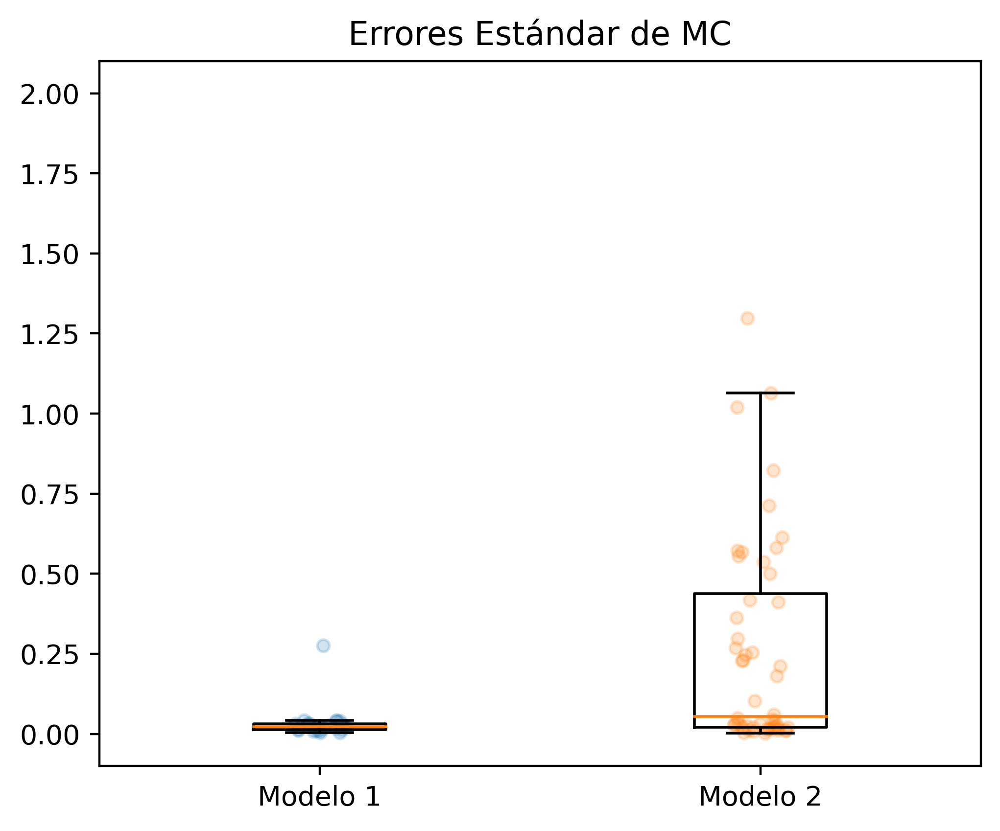

In [20]:
# Errores estandar de MC
f = plt.figure(figsize = (5,4), dpi = 400)
ax = f.add_axes([0.1,0.1,0.9,0.9])
mybox = ax.boxplot([EEMC_M1,EEMC_M2],showfliers = False,widths = 0.3)
wd = 1/8
ax.scatter(x = 1 - wd/2 + np.random.random(m + 3)*wd,y = EEMC_M1,s = 20,alpha = 0.2)
ax.scatter(x = 2 - wd/2 + np.random.random(2*m + 4)*wd,y = EEMC_M2,s = 20,alpha = 0.2)
ax.set_ylim((-0.1,2.1))
ax.set_xticks(ticks = [1,2],labels = ['Modelo 1','Modelo 2'])
ax.set_title('Errores Estándar de MC')

### 4.6 Inferencia

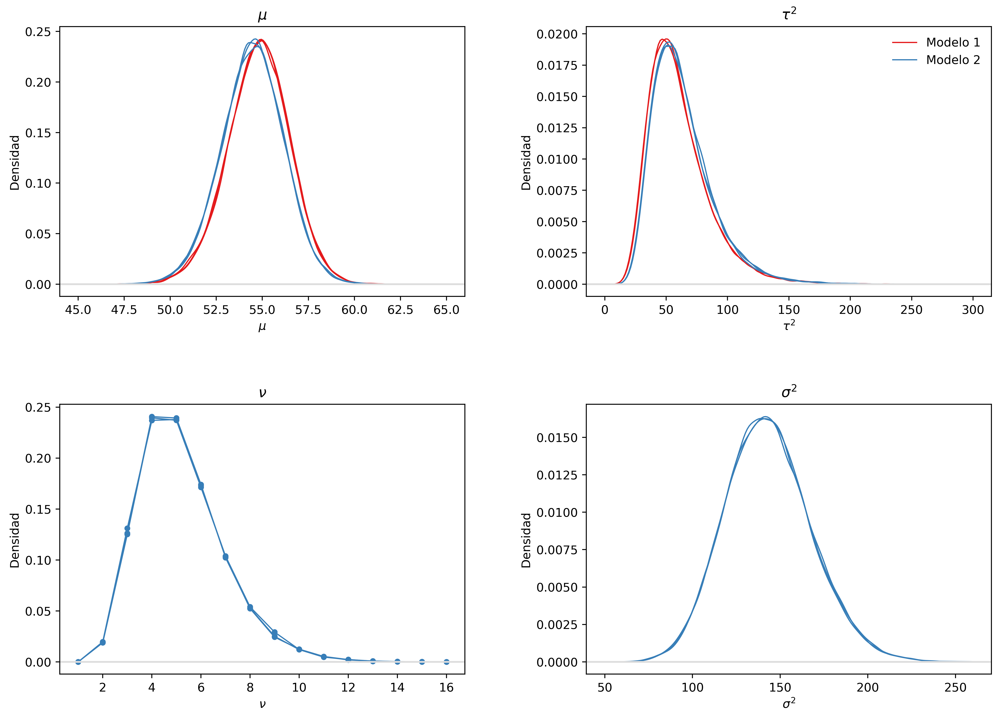

In [21]:
# graficas
col = sns.color_palette('Set1')
f, axes = plt.subplots(2, 2, figsize = (14,10),dpi = 500)
plt.subplots_adjust(wspace = 0.3, hspace = 0.4)
# posterior mu
mu_grid = np.linspace(45,65,num = 200)
tmp_kernel = st.gaussian_kde(np.reshape(np.array(cadena1_M1['THETA'][['mu']]),newshape = (B,)))
axes[0,0].plot(mu_grid,tmp_kernel(mu_grid),color = col[0],linewidth = 1)
tmp_kernel = st.gaussian_kde(np.reshape(np.array(cadena2_M1['THETA'][['mu']]),newshape = (B,)))
axes[0,0].plot(mu_grid,tmp_kernel(mu_grid),color = col[0],linewidth = 1)
tmp_kernel = st.gaussian_kde(np.reshape(np.array(cadena3_M1['THETA'][['mu']]),newshape = (B,)))
axes[0,0].plot(mu_grid,tmp_kernel(mu_grid),color = col[0],linewidth = 1)
tmp_kernel = st.gaussian_kde(np.reshape(np.array(cadena1_M2['THETA'][['mu']]),newshape = (B,)))
axes[0,0].plot(mu_grid,tmp_kernel(mu_grid),color = col[1],linewidth = 1)
tmp_kernel = st.gaussian_kde(np.reshape(np.array(cadena2_M2['THETA'][['mu']]),newshape = (B,)))
axes[0,0].plot(mu_grid,tmp_kernel(mu_grid),color = col[1],linewidth = 1)
tmp_kernel = st.gaussian_kde(np.reshape(np.array(cadena3_M2['THETA'][['mu']]),newshape = (B,)))
axes[0,0].plot(mu_grid,tmp_kernel(mu_grid),color = col[1],linewidth = 1)
#
axes[0,0].axhline(y = 0,color = '#dddddd')
axes[0,0].set_title(r'$\mu$')
axes[0,0].set_xlabel(r'$\mu$')
axes[0,0].set_ylabel('Densidad')
# posterior tau^2
tau2_grid = np.linspace(0,300,num = 200)
tmp_kernel = st.gaussian_kde(np.reshape(np.array(cadena1_M1['THETA'][['tau2']]),newshape = (B,)))
axes[0,1].plot(tau2_grid,tmp_kernel(tau2_grid),color = col[0],linewidth = 1,label = 'Modelo 1')
tmp_kernel = st.gaussian_kde(np.reshape(np.array(cadena2_M1['THETA'][['tau2']]),newshape = (B,)))
axes[0,1].plot(tau2_grid,tmp_kernel(tau2_grid),color = col[0],linewidth = 1)
tmp_kernel = st.gaussian_kde(np.reshape(np.array(cadena2_M1['THETA'][['tau2']]),newshape = (B,)))
axes[0,1].plot(tau2_grid,tmp_kernel(tau2_grid),color = col[0],linewidth = 1)
tmp_kernel = st.gaussian_kde(np.reshape(np.array(cadena1_M2['THETA'][['tau2']]),newshape = (B,)))
axes[0,1].plot(tau2_grid,tmp_kernel(tau2_grid),color = col[1],linewidth = 1,label = 'Modelo 2')
tmp_kernel = st.gaussian_kde(np.reshape(np.array(cadena2_M2['THETA'][['tau2']]),newshape = (B,)))
axes[0,1].plot(tau2_grid,tmp_kernel(tau2_grid),color = col[1],linewidth = 1)
tmp_kernel = st.gaussian_kde(np.reshape(np.array(cadena3_M2['THETA'][['tau2']]),newshape = (B,)))
axes[0,1].plot(tau2_grid,tmp_kernel(tau2_grid),color = col[1],linewidth = 1)
#
axes[0,1].legend(loc = 0, frameon = False)
axes[0,1].axhline(y = 0,color = '#dddddd')
axes[0,1].set_title(r'$\tau^2$')
axes[0,1].set_xlabel(r'$\tau^2$')
axes[0,1].set_ylabel('Densidad')
# posterior nu
tmp = cadena1_M2['THETA'][['nu']].value_counts(sort=False).reset_index()
axes[1,0].plot(tmp.nu,tmp.loc[:,0]/25000,linewidth = 1,color = col[1])
axes[1,0].scatter(tmp.nu,tmp.loc[:,0]/25000, s = 15,color = col[1])
tmp = cadena2_M2['THETA'][['nu']].value_counts(sort=False).reset_index()
axes[1,0].plot(tmp.nu,tmp.loc[:,0]/25000,linewidth = 1,color = col[1])
axes[1,0].scatter(tmp.nu,tmp.loc[:,0]/25000, s = 15,color = col[1])
tmp = cadena3_M2['THETA'][['nu']].value_counts(sort=False).reset_index()
axes[1,0].plot(tmp.nu,tmp.loc[:,0]/25000,linewidth = 1,color = col[1])
axes[1,0].scatter(tmp.nu,tmp.loc[:,0]/25000, s = 15,color = col[1])
#
axes[1,0].axhline(y = 0,color = '#dddddd')
axes[1,0].set_title(r'$\nu$')
axes[1,0].set_xlabel(r'$\nu$')
axes[1,0].set_ylabel('Densidad')
# posterior sigma^2
sig2_grid = np.linspace(50,260,num = 200)
tmp_kernel = st.gaussian_kde(np.reshape(np.array(cadena1_M2['THETA'][['ups2']]),newshape = (B,)))
axes[1,1].plot(sig2_grid,tmp_kernel(sig2_grid),color = col[1],linewidth = 1)
tmp_kernel = st.gaussian_kde(np.reshape(np.array(cadena2_M2['THETA'][['ups2']]),newshape = (B,)))
axes[1,1].plot(sig2_grid,tmp_kernel(sig2_grid),color = col[1],linewidth = 1)
tmp_kernel = st.gaussian_kde(np.reshape(np.array(cadena3_M2['THETA'][['ups2']]),newshape = (B,)))
axes[1,1].plot(sig2_grid,tmp_kernel(sig2_grid),color = col[1],linewidth = 1)
#
axes[1,1].axhline(y = 0,color = '#dddddd')
axes[1,1].set_title(r'$\sigma^2$')
axes[1,1].set_xlabel(r'$\sigma^2$')
axes[1,1].set_ylabel('Densidad')
#
plt.show()

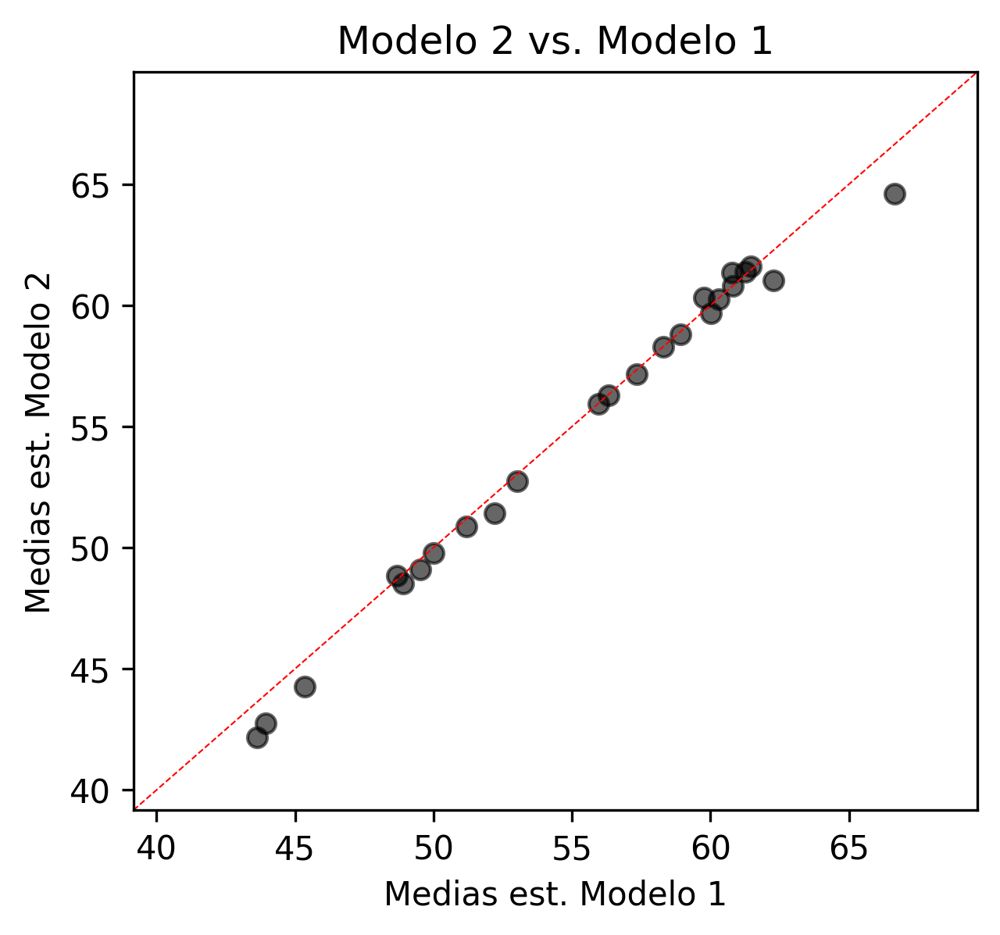

In [22]:
# thetas estimados Modelo 2 vs Modelo 1
theta_hat_M1 = np.mean(np.array(cadena1_M1['THETA'])[:,:m],axis = 0)
theta_hat_M2 = np.mean(np.array(cadena1_M2['THETA'])[:,:m],axis = 0)
rango = (np.min(list(theta_hat_M1) + list(theta_hat_M2))-3,
         np.max(list(theta_hat_M1) + list(theta_hat_M2))+3)
f = plt.figure(figsize = (4,3.5), dpi = 300)
ax = f.add_axes([0.1,0.1,0.9,0.9])
#
ax.plot([rango[0],rango[1]],[rango[0],rango[1]],
        color = 'red',linewidth = 0.5,ls = '--')
ax.scatter(theta_hat_M1,theta_hat_M2,c = 'black',alpha = 0.6)
ax.set_ylim((*rango,))
ax.set_xlim((*rango,))
ax.set_xlabel('Medias est. Modelo 1')
ax.set_ylabel('Medias est. Modelo 2')
ax.set_title('Modelo 2 vs. Modelo 1')
#
plt.show()

In [23]:
# correlacion
r = np.corrcoef(theta_hat_M1,theta_hat_M2)
r[0,1]

0.9956458911248872

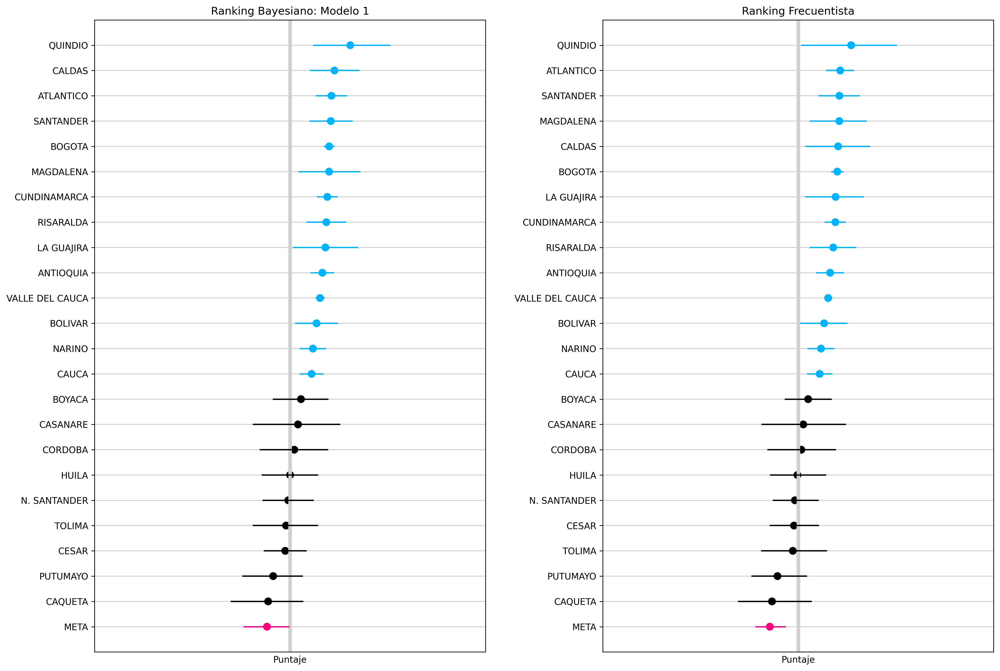

In [24]:
# ranking bayesiano: Modelo 1
THETA = np.array(cadena1_M1['THETA'])
ids2 = np.array(estadisticos.reset_index(level = 1).nombre)
that = np.mean(THETA[:,:m],axis = 0)
ic1 = [list(np.quantile(THETA[:,k], q = [0.025,0.975])) for k in range(m)]
ranking = np.array(np.argsort(that))
ids2 = ids2[ranking]
that = that[ranking]
ic1  = np.array(ic1)[ranking,:]
colo = np.array([2]*m)
colo[ic1[:,0]>50] = 1
colo[ic1[:,1]<50] = 3
colo = np.array(['#00B3FF','#000000','#FF0080'])[colo-1]
# grafico
f, ax = plt.subplots(1, 2, figsize = (18,13), dpi = 300)
plt.subplots_adjust(wspace = 0.3, hspace = 0.2)
#
ax[0].set_xlim((-4,104));ax[0].set_ylim((0,m+1)) # Límites del gráfico
ax[0].axvline(x = 50, color = '#d0d0d0', linewidth = 4) # Linea vertical central
for k in range(m):
    ax[0].axhline(y = k+1, color = '#d0d0d0', linewidth = 1) # Lineas horizontales
    ax[0].plot(ic1[k,:],[k+1]*2, # intervalo de credibilidad por departamento
               color = colo[k])
ax[0].scatter(x = that, y = range(1,m+1),s = 60,color = colo) # media posterior de departamento
ax[0].set_title('Ranking Bayesiano: Modelo 1') # Título
ax[0].set_xticks(ticks = []) # Quitar coordenadas del eje x
ax[0].set_yticks(ticks = range(1,m+1), # Poner departamentos en el eje y
              labels = ids2)
ax[0].set_xlabel('Puntaje')
# ranking bayesiano: Modelo 2
THETA = np.array(cadena1_M2['THETA'])
ids2 = np.array(estadisticos.reset_index(level = 1).nombre)
that = np.mean(THETA[:,:m],axis = 0)
ic1 = [list(np.quantile(THETA[:,k], q = [0.025,0.975])) for k in range(m)]
ranking = np.array(np.argsort(that))
ids2 = ids2[ranking]
that = that[ranking]
ic1  = np.array(ic1)[ranking,:]
colo = np.array([2]*m)
colo[ic1[:,0]>50] = 1
colo[ic1[:,1]<50] = 3
colo = np.array(['#00B3FF','#000000','#FF0080'])[colo-1]
# grafico
ax[1].set_xlim((-4,104));ax[1].set_ylim((0,m+1)) # Límites del gráfico
ax[1].axvline(x = 50, color = '#d0d0d0', linewidth = 4) # Linea vertical central
for k in range(m):
    ax[1].axhline(y = k+1, color = '#d0d0d0', linewidth = 1) # Lineas horizontales
    ax[1].plot(ic1[k,:],[k+1]*2, # intervalo de confianza por departamento
               color = colo[k])
ax[1].scatter(x = that, y = range(1,m+1),s = 60,color = colo) # estimación de la media de departamento
ax[1].set_title('Ranking Frecuentista') # Título
ax[1].set_xticks(ticks = []) # Quitar coordenadas del eje x
ax[1].set_yticks(ticks = range(1,m+1), # Poner departamentos en el eje y
              labels = ids2)
ax[1].set_xlabel('Puntaje')
#
plt.show()

## Referencias

<img src="Hoffcoverbook.jpg" width = 250 />

<img src="Gelmancoverbook.png" width = 250 />

<img src="Reichcoverbook.jpg" width = 250 />